<a href="https://colab.research.google.com/github/Joselu04/Estad-stica_1/blob/main/Estadistica1_Examen_2_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Estadistica descriptiva para variables cuantitativas


*   Graficos para datos univariados cuantitativos
*   Determinar las medidas descriptivas para datos univariados cuantitativos



In [1]:
from google.colab import files # Para cargar archivos en google colab
uploaded = files.upload()

Saving asriosgu_nac2020.csv to asriosgu_nac2020.csv


In [3]:
import pandas as pd
import io
io_csv = io.BytesIO(uploaded['asriosgu_nac2020.csv'])
tabla = pd.read_csv(io_csv, sep = ",", index_col=0, encoding='latin-1')
tabla.head(3)

,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,AREA_RES,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
44,560,3,2,NaN,2,9,9,2020,11,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,1,9,9,2020,10,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,1,9,9,2020,10,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5


In [4]:
df = tabla[["EDAD_PADRE", "EDAD_MADRE", "N_HIJOSV"]]
df.head(3)

,EDAD_PADRE,EDAD_MADRE,N_HIJOSV
COD_DPTO,,,
44,20,4,1
44,20,4,1
44,20,5,1


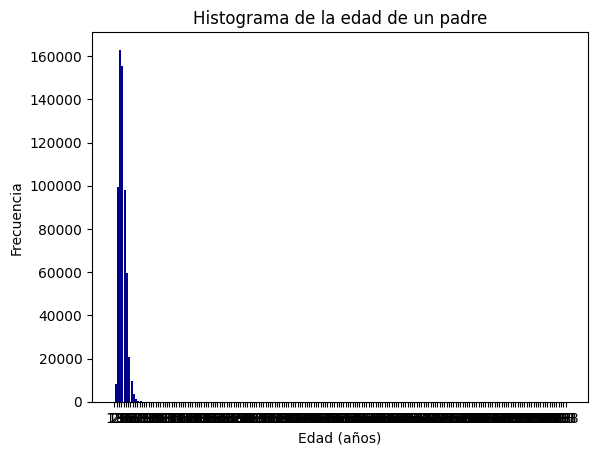

In [5]:
import matplotlib.pyplot as plot
intervalos = range(min(df.EDAD_PADRE), max(df.EDAD_PADRE) + 1, 5)
plot.hist(df.EDAD_PADRE, bins=intervalos, color='darkblue', rwidth=0.85)
plot.title('Histograma de la edad de un padre')
plot.xlabel('Edad (años)')
plot.ylabel('Frecuencia')
plot.xticks(intervalos)
plot.show()

In [6]:
df1 = df[(df.EDAD_PADRE < 120) & (df.EDAD_MADRE != 99) & (df.N_HIJOSV != 99)]
df1.head(5)

,EDAD_PADRE,EDAD_MADRE,N_HIJOSV
COD_DPTO,,,
44,20,4,1
44,20,4,1
44,20,5,1
44,20,5,1
44,20,3,1


<ipython-input-7-932b91f23990>:13: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plot.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "darkblue")


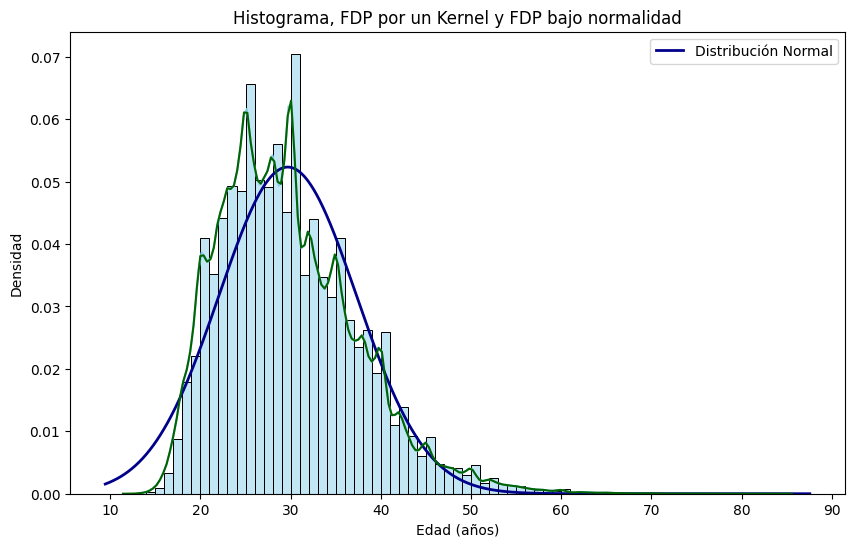

In [7]:
import seaborn as sns
import numpy as np
from scipy.stats import norm

intervalos1 = range(min(df1.EDAD_PADRE), max(df1.EDAD_PADRE) + 1)
plot.figure(figsize=(10, 6))
sns.histplot(x = df1.EDAD_PADRE, bins = intervalos1, kde = True, stat = "density", color = "skyblue", edgecolor='black') # kde = True es la gráfica de la función de densidad de probabilidad estimada por un método Kernell

xmin, xmax = plot.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(df1.EDAD_PADRE), np.std(df1.EDAD_PADRE))

plot.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "darkblue")
sns.kdeplot(x=df1.EDAD_PADRE, color = "darkgreen")

plot.title('Histograma, FDP por un Kernel y FDP bajo normalidad')
plot.xlabel('Edad (años)')
plot.ylabel('Densidad')
plot.legend()

# Mostrar el gráfico
plot.show()


Sea $X:=$ Edad del padre de un recien nacido en colombia.

Descriptivamente como la funcion de densidad de probabilidad de los datos estimada por un metodo kernel (linea verde) no coincide con la funcion de densidad de probabilidad asumiendo el supuesto de normalidad (linea azul)
$X\sim \text{normal} (\text{media} = \bar{x}, \text{varianza} = S^2_X)$
Entonces  no asumimos normalidad ya que no cocinciden las graficas.

In [8]:
from scipy.stats import shapiro
shapiro(df1.EDAD_PADRE)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.9588148593902588, pvalue=0.0)

*   si el $\text valor p$ en una prueba de hipótesis es menor que 0.05 se rechaza la hipótesis nula con una confianza del 95%
*   Si el $\text valor p$ en una prueba de hipótesis es mayor que 0.05 no se rechaza la hipótesis nula con una confianza del 95%


En nuestro caso particular, tenemos que pvalue = 0.0 < 0.05, es decir, se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en Colombia presenta distribución normal.

In [9]:
df1.EDAD_PADRE.count()
len(df1.EDAD_PADRE)

619932

In [10]:
idx = np.random.randint(len(df1.EDAD_PADRE), size = 100)
shapiro(df1.EDAD_PADRE.index[idx])

ShapiroResult(statistic=0.8465560078620911, pvalue=8.865836953475537e-09)

Como el valor p (igual a $1.0786125326234242*10^{-9}$) es menor que 0.05 entonces se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en Colombia presente distribución normal.

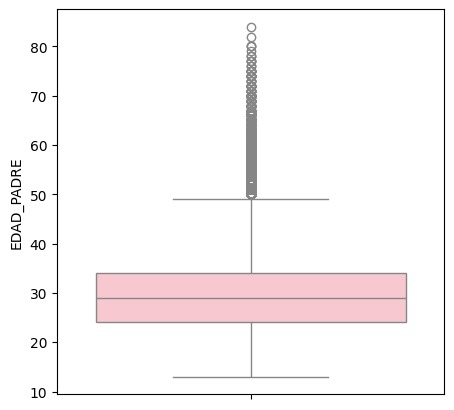

In [11]:
import seaborn
plot.figure(figsize=(5, 5))
sns.boxplot(df1.EDAD_PADRE, color='pink', saturation=0.75)
plot.show()

Se considera que la edad de un padre, de un recién nacido en Colombia es atípica si es mayor que 50 años. El primer cuartil es aproximadamente 25 años, la media aritmética es aproximadamente 29 años y el tercer cuartil es aproximadamente 35 años.

**Rango intercuartilico = Tercer cuartil - Primer cuartil** = **35 - 25 = 10**

In [12]:
import plotly.express as px
plot.figure(figsize=(5, 5))
fig = px.strip(df1.EDAD_PADRE, orientation = 'h')
fig.show()

<Figure size 500x500 with 0 Axes>

De acuerdo con el diagrama de puntos se observa una alta variabilidad de la edad de un padre de un recién Nacido en Colombia

In [13]:
import numpy as np
from scipy.stats import skew, kurtosis
print(f"Media: {np.mean(df1.EDAD_PADRE)}")
print(f"Varianza {np.var(df1.EDAD_PADRE)} y la desviación estándar es de {np.std(df1.EDAD_PADRE)}")
print(f"Asimetría: {skew(df1.EDAD_PADRE)}")
print(f"Curtosis: {kurtosis(df1.EDAD_PADRE)}")

Media: 29.677262990134402
Varianza 58.1377076723756 y la desviación estándar es de 7.624808697428126
Asimetría: 0.8353028835229743
Curtosis: 0.9739261066839422




*   Aproximadamente el promedio de la edad de un padre de un recién nacido en Colombia es de 29.7 años
*   Aproximadamente la distancia entre los valores de la edad edad un padre de un recién nacido en Colombia y la media es de 7.62 años


*   La distribución de la edad de un padre de un recién nacido en Colombia es asimétrica positiva, es decir, la media es mayor que la moda de la variable aleatoria
*   La distribución es platicúrtica, es decir, hay una baja concentración de las edades de un padre de un recién nacido en Colombia con respecto a la media





* Diagrama de dispersión y la recta de regresión para datos bivariados

Una variable depende de la otra, cuando la ejecución de esta se ve afectada por la variable independiente.
$\text{Ejemplo}$: El precio de una vivienda depende del número de habitaciones, ya que entre más habitaciones se tiene mayor precio.

Una variable está correlacionada con otra, cuando guardan cierta relación, pero no es posible hablar de dependencia. $\text{Ejemplo}$: Consumo de arroz y de carne, ya que se ha visto que al comerse más arroz se come más carne, pero no hay una dependencia entre estas dos variables

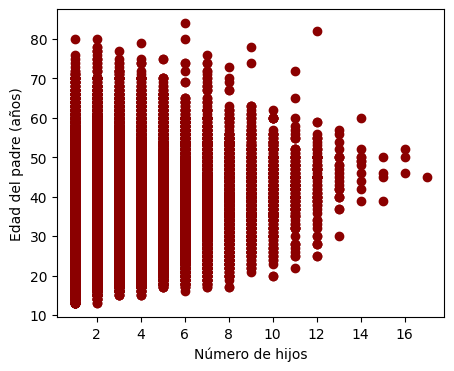

In [14]:
plot.figure(figsize=(5, 4))
plot.scatter(df1["N_HIJOSV"], df1["EDAD_PADRE"], color = "darkred", marker = "o")
plot.xlabel('Número de hijos')
plot.ylabel('Edad del padre (años)')
plot.show()

Se observa en el diagrama de dispersión una nube de puntos sin un patrón particular, esto quiere decir que las variables son independientes o no están correlacionadas. Para nuestro ejemplo quiere decir que el número de hijos y la edad de un padre en Colombia no están correlacionadas (padre joven con muchos hijos o un padre mayor con pocos hijos)

In [15]:
from sklearn.linear_model import LinearRegression
modelo = LinearRegression()
# df1["N_HIJOSV"] es igual a escribir df1.N_HIJOSV
modelo.fit(np.array(df1.N_HIJOSV).reshape(-1, 1), np.array(df1["EDAD_PADRE"]).reshape(-1, 1))
predi_lineal = modelo.predict(np.array(df1.N_HIJOSV).reshape(-1, 1))
predi_lineal

array([[27.63034824],
       [27.63034824],
       [27.63034824],
       ...,
       [29.82688099],
       [27.63034824],
       [27.63034824]])

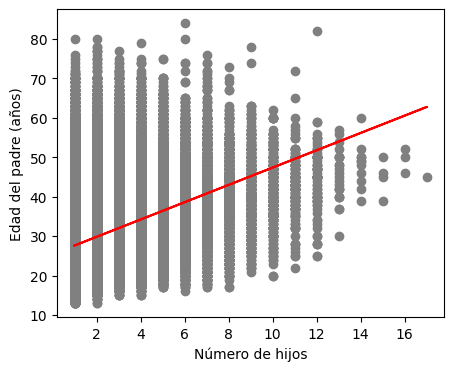

In [20]:
plot.figure(figsize=(5, 4))
plot.scatter(df1["N_HIJOSV"], df1["EDAD_PADRE"], color = "grey", marker = "o")
plot.plot(df1["N_HIJOSV"], predi_lineal, linestyle='-', color = "red")
plot.xlabel('Número de hijos')
plot.ylabel('Edad del padre (años)')
plot.show()

De acuerdo con la recta de regresión se determina una correlación positiva, es decir que entre más hijos tiene un hombre en Colombia, más años tiene esta persona.

La variable Y depende positivamente de la variable X, es decir, entre mayor valor de X se tenga, mayor será el valor de Y

In [16]:
import numpy as np
from scipy.stats import spearmanr
from scipy.stats import kendalltau
coef_pearson = np.corrcoef(df1["N_HIJOSV"], df1["EDAD_PADRE"])[0, 1]
coef_spearman, _ = spearmanr(df1["N_HIJOSV"], df1["EDAD_PADRE"])
coef_kendall, _ = kendalltau(df1["N_HIJOSV"], df1["EDAD_PADRE"])
print(f"Los coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente {coef_pearson}, {coef_spearman} y {coef_kendall}.")

Los coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente 0.339909584425517, 0.3645543846935495 y 0.2875746849739477.


Para la interpretación de los coeficientes de correlación nos ayudaremos de la referencia:
Landis, J. R., & Koch, G. G. (1977). The measurement of observer agreement for categorical data. biometrics, 159-174. [Link](https://www.jstor.org/stable/2529310)



*   X y Y son independientes o no están correlacionadas: \\
$\rho(X,Y) = 0 \\
\eta(X,Y) = 0 \\
 \kappa(X,Y) = 0$
*   Y depende insignificantemente de X o X y Y están insignificantmente correlacionadas si: \\
$0 < |\rho(X,Y)| < 0.2$ \\
$0 < |\eta(X,Y)| < 0.2$ \\
$0 < | \kappa (X,Y)| < 0.2$ \\

* Y depende discretamente de X o X y Y están discretamente correlacionadas si: \\
$0.2 < |\rho(X,Y)| < 0.4 $ \\
$0.2 < |\eta(X,Y)| < 0.4 $ \\
$0.2 < | \kappa (X,Y)| < 0.4 $ \\

* Y depende moderadamente de X o X y Y están moderadamente correlacionadas si: \\
$0.4 < |\rho(X,Y)| < 0.6 $ \\
$0.4 < |\eta(X,Y)| < 0.6 $ \\
$0.4 < | \kappa (X,Y)| < 0.6 $ \\

* Y depende sustancialmente de X o X y Y están sustancialmente correlacionadas si: \\
$0.6 < |\rho(X,Y)| < 0.8 $ \\
$0.6 < |\eta(X,Y)| < 0.8 $ \\
$0.6 < | \kappa (X,Y)| < 0.8 $ \\

* Y depende fuertemente de X o X y Y están fuertmente correlacionadas si:\\
$0.8 < |\rho(X,Y)| < 1 $ \\
$0.8 < |\eta(X,Y)| < 1 $ \\
$0.8 < | \kappa (X,Y)| < 1 $ \\

De acuerdo con los coeficientes de correlación de Pearson, de Kendall y de Spearman se determina que el número de hijos de un padre y la edad de un padre de un recién nacido en Colombia están discretamente correlacionadas.
